In [1]:
import numpy as np

In [2]:
import os

In [3]:
from updown_data import updown_z

In [4]:
import matplotlib.pyplot as plt
% matplotlib inline

In [5]:
from keras.layers import Input
from keras.layers import concatenate, add
from keras.layers.convolutional import Conv2D, MaxPooling2D, AveragePooling2D
from keras.layers.core import Flatten, Dense
from keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint
from keras.models import Model
from keras.losses import categorical_crossentropy
from keras.optimizers import Adadelta


Using TensorFlow backend.


In [6]:
import pandas as pd

In [7]:
from data_loaders import data_generator, get_n_iterations, get_class_weights

In [8]:
from data_files import get_train_validation_test_files, get_multi_data_files

In [9]:
#IRON_HIDE
train_test_folder = os.path.join("/data", "km3net", "Xy_multi_data_files", "train_test_files","updown_numu_nue_stratified")

#UNISA
train_test_folder = os.path.join("Xy_multi_data_files_logE","train_test_files","updown_numu_nue_stratified")

In [10]:
fnames_train, fnames_val, fnames_test, index_split_files = get_train_validation_test_files(train_test_folder)

In [11]:
n_files = 100
steps_per_epoch, n_events = get_n_iterations(fnames_train[:n_files])
print(steps_per_epoch, n_events)
validation_steps, n_evts_val = get_n_iterations(fnames_val[:n_files])
print(validation_steps, n_evts_val)

prediction_steps, n_evts_test = get_n_iterations(fnames_test[:n_files])
print(prediction_steps, n_evts_test)

get_class_weights(fnames_train[:n_files])
cls_weights = {i:v for i, v in enumerate(get_class_weights(fnames_train[:n_files]))}


2588 165610
648 41451
810 51818


In [12]:
def vgg_tz(num_classes, optimizer, include_dense=False):
    """VGG inspired Convolutional Networks with multiple inputs
    
    Parameters
    ----------
    num_classes : int
        Number of classes to predict
            
    optimizer : keras.optimizers.Optimizer
        Instance of Keras optimizer to attach to the resulting network
        
    include_dense : bool (default False)
        Flag indicating wether to include a Dense Layer at the top 
        of each separate vgg-like sub-network.
    """
    
    def _conv_block(input_layer, include_dense=False, pooling_size=(2, 2)):
        """VGG-inspired Convolutional Blocks"""
        
        prefix = input_layer.name.split('_')[0]

        # Block 1
        x = Conv2D(32, kernel_size=(12, 12), activation='relu', 
                   padding='same', name='{}_block1_conv1'.format(prefix))(input_layer)
        
        x = Conv2D(32, kernel_size=(12, 12), activation='relu', 
                   padding='same', name='{}_block1_conv2'.format(prefix))(x)
        
        x = AveragePooling2D(pool_size=pooling_size, strides=(2, 2), 
                         padding='same', name='{}_block1_pool'.format(prefix))(x)

        # Block 2
        x = Conv2D(64, kernel_size=(12, 12), activation='relu', 
                   padding='same', name='{}_block2_conv1'.format(prefix))(x)
        
        x = Conv2D(64, kernel_size=(12, 12), activation='relu', 
                   padding='same', name='{}_block2_conv2'.format(prefix))(x)
        
        x = AveragePooling2D(pool_size=pooling_size, strides=(2, 2), 
                         padding='same', name='{}_block2_pool'.format(prefix))(x)

        # Block 3
        x = Conv2D(128, kernel_size=(12, 12), activation='relu', 
                   padding='same', name='{}_block3_conv2'.format(prefix))(x)
        
        x = AveragePooling2D(pool_size=pooling_size, strides=(2, 2), 
                             padding='same', name='{}_block3_pool'.format(prefix))(x)
        x = Flatten()(x)
        if include_dense:
            x = Dense(512)(x)
        return x


    ZT_SHAPE = (1, 75, 18)
    zt_layer = Input(shape=ZT_SHAPE, name='zt_input')
    
    zt_branch = _conv_block(zt_layer, pooling_size=(6, 6))#, include_dense)
        
    x = Dense(512, activation='relu', name='fc-1')(zt_branch)
    x = Dense(512, activation='relu', name='fc-2')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=zt_layer, outputs=predictions, name='vgglike_tz')
    model.compile(loss=categorical_crossentropy, optimizer=optimizer, metrics=['accuracy'])
    return model

### testing updown with cosz (cosz<=0: down, cosz>0: up)

In [14]:
b_size = 64
epochs = 100
fargs = {'num_classes': 2, 'optimizer': Adadelta()}
vgg_tz_net = vgg_tz(**fargs)

fitargs = {'steps_per_epoch': steps_per_epoch, 'epochs': epochs, 'verbose': 1, 'shuffle': True,
           'class_weight' : {i:v for i, v in enumerate(get_class_weights(fnames_train[:n_files]))},
           "callbacks": [#TensorBoard(batch_size=b_size, histogram_freq=5, embeddings_freq=5,
                         #           embeddings_layer_names=["zt_block1_conv1", "zt_block1_conv2"]), 
                         ModelCheckpoint("models/vgg_tz_updown_cosz_cls_weighted_"+str(n_files)+"files_"+str(b_size)+"_12x12_"+str(epochs)+"epochs.hdf5",
                                                        save_best_only=True),
                         EarlyStopping(monitor="val_loss", patience=5)]}
history_vgg_tz = vgg_tz_net.fit_generator(generator_tz(fnames_train[:n_files], batch_size=b_size), 
                                          validation_data=generator_tz(fnames_validation[:n_files]),
                                          validation_steps=validation_steps, **fitargs)




Epoch 1/100
2588/2588 [==============================] - 448s - loss: 0.2360 - acc: 0.8951 - val_loss: 0.1637 - val_acc: 0.9279
Epoch 2/100
2588/2588 [==============================] - 431s - loss: 0.1699 - acc: 0.9284 - val_loss: 0.1577 - val_acc: 0.9297
Epoch 3/100
2588/2588 [==============================] - 434s - loss: 0.1611 - acc: 0.9324 - val_loss: 0.1543 - val_acc: 0.9308
Epoch 4/100
2588/2588 [==============================] - 428s - loss: 0.1558 - acc: 0.9345 - val_loss: 0.1526 - val_acc: 0.9317
Epoch 5/100
2588/2588 [==============================] - 431s - loss: 0.1519 - acc: 0.9364 - val_loss: 0.1529 - val_acc: 0.9318
Epoch 6/100
2588/2588 [==============================] - 432s - loss: 0.1486 - acc: 0.9377 - val_loss: 0.1526 - val_acc: 0.9323
Epoch 7/100
2588/2588 [==============================] - 432s - loss: 0.1458 - acc: 0.9391 - val_loss: 0.1521 - val_acc: 0.9327
Epoch 8/100
2588/2588 [==============================] - 431s - loss: 0.1430 - acc: 0.9406 - val_loss: 0

In [12]:
import keras

In [13]:
vgg_tz_net = keras.models.load_model("models/vgg_tz_updown_cosz_cls_weighted_100files_64_12x12_100epochs.hdf5")

In [16]:
from keras import backend as K
def get_activations(model, layer, X_batch):
    activations_f = K.function([model.layers[0].input, K.learning_phase()], [layer.output,])
    activations = activations_f((X_batch, False))
    return activations

In [17]:
for l in vgg_tz_net.layers:
    print(l.name)

zt_input
zt_block1_conv1
zt_block1_conv2
zt_block1_pool
zt_block2_conv1
zt_block2_conv2
zt_block2_pool
zt_block3_conv2
zt_block3_pool
flatten_1
fc-1
fc-2
dense_1


In [18]:
block_conv_1_layer = vgg_tz_net.layers[1]

In [19]:
fname = fnames_train[0]
X = np.load(fname)["x"]
def get_TZ(X):

    TZ = np.sum(X, axis=(2,3))

    return TZ
TZ = get_TZ(X)

In [20]:
TZ = TZ.reshape((1623, 1, 75, 18))

In [21]:
TZ.shape

(1623, 1, 75, 18)

In [23]:
activations = get_activations(vgg_tz_net, block_conv_1_layer, TZ)

In [27]:
activations = activations[0]

In [28]:
activations.shape

(1623, 32, 75, 18)

In [29]:
from sklearn.manifold import TSNE

In [30]:
y = np.load(fname)["y"]

In [31]:
y.shape

(1623,)

In [33]:
y[y <= 0] = 0
y[y > 0] = 1
y

array([ 0.,  0.,  1., ...,  0.,  1.,  1.])

In [35]:
activations = activations.reshape((1623, 32, 75*18))

In [36]:
activations.shape

(1623, 32, 1350)

In [45]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [46]:
%matplotlib inline

In [47]:
X_tsne_1.shape

(1623, 2)

/usr/local/lib/python2.7/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


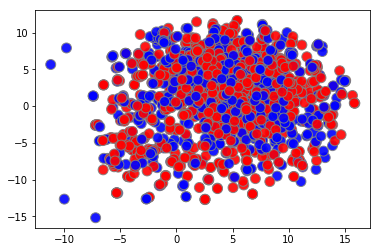

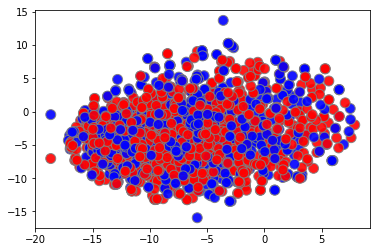

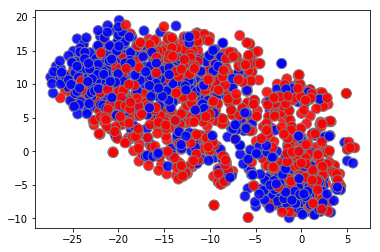

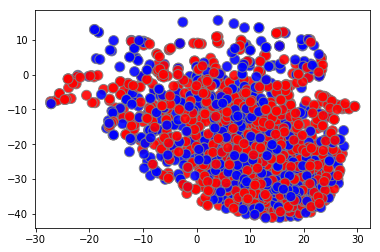

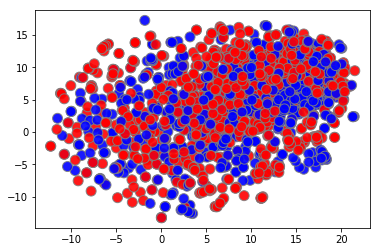

...

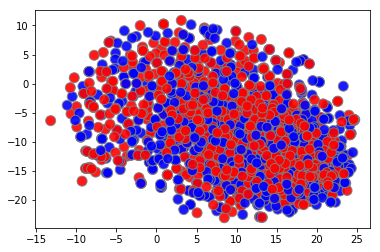

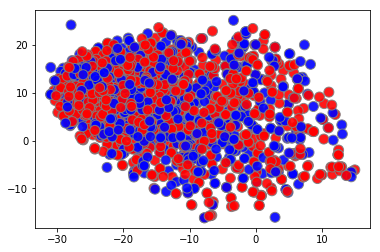

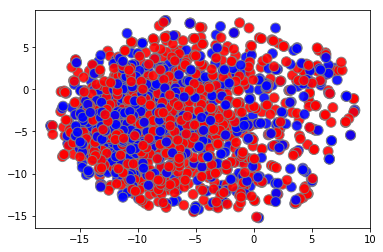

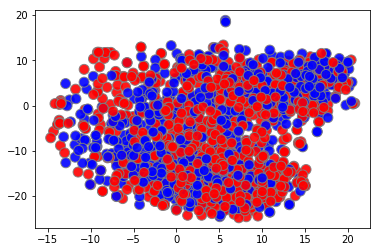

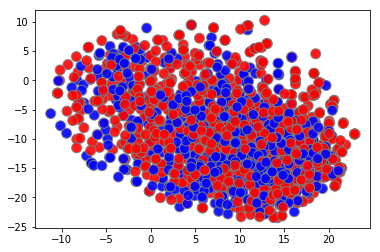

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


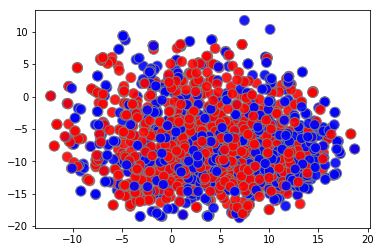

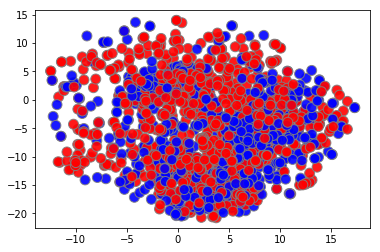

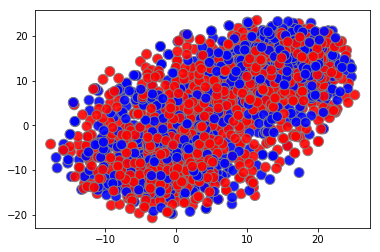

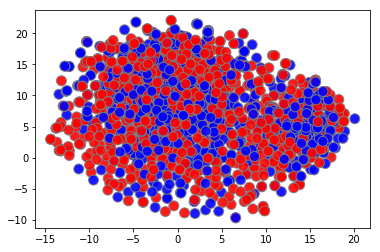

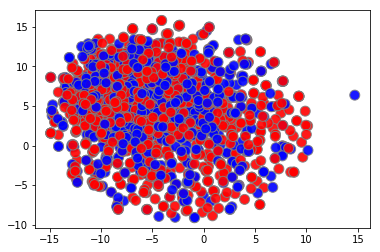

In [52]:
for i in range(32):
    plt.figure()
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(activations[:, i, :])
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], 
               color=cm.bwr(y),s=100, alpha=0.9, edgecolor="gray")

In [53]:
block3_conv2_layer = vgg_tz_net.layers[7]

In [54]:
activations_block3_conv2 = get_activations(vgg_tz_net, block3_conv2_layer, TZ)

In [55]:
activations_b3c2 = activations_block3_conv2[0]

In [56]:
activations_b3c2.shape

(1623, 128, 19, 5)

In [57]:
activations_b3c2 = activations_b3c2.reshape(1623, 128, 19*5)

AssertionError: [t-SNE] Insertion failed

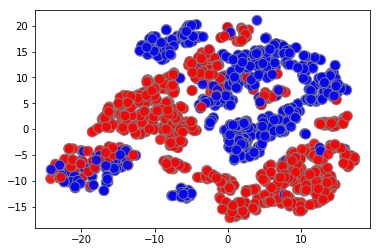

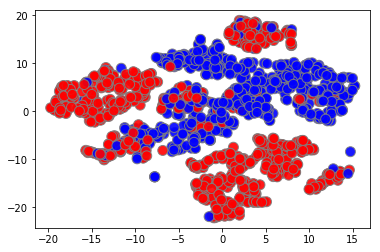

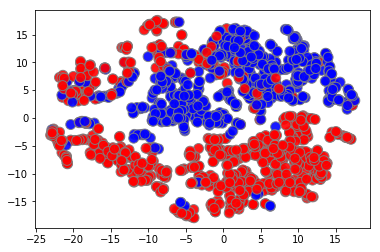

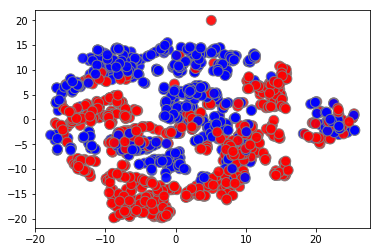

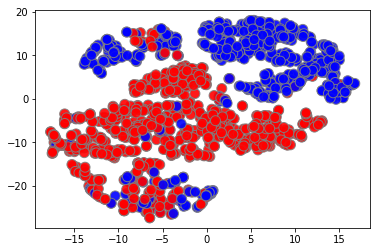

...

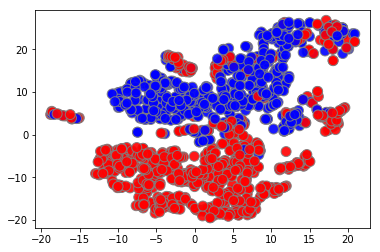

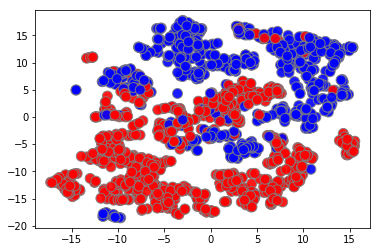

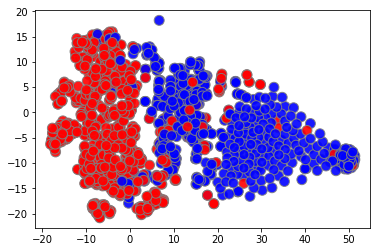

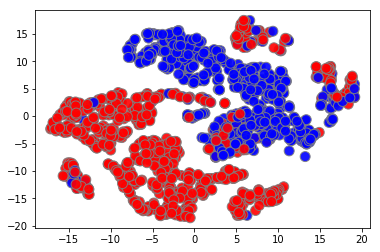

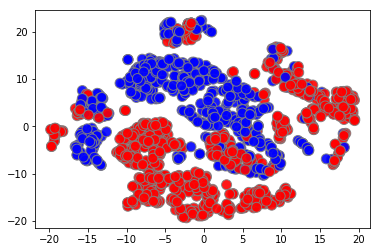

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


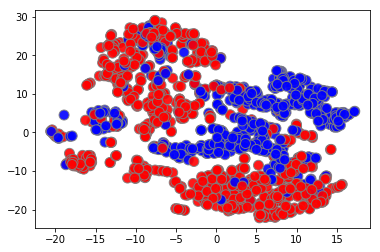

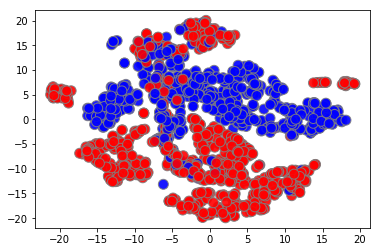

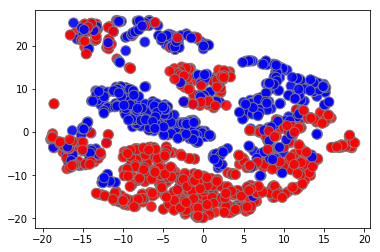

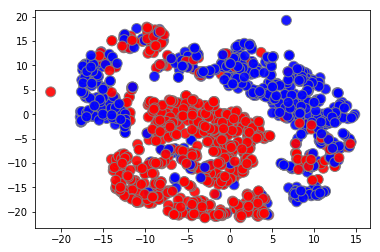

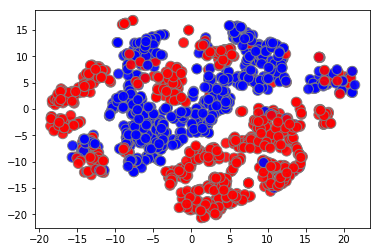

...

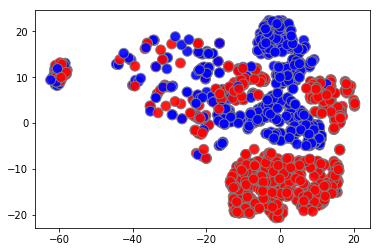

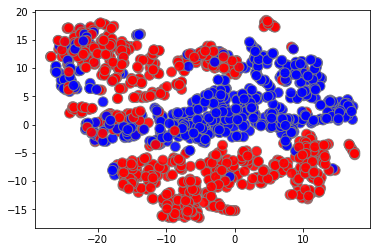

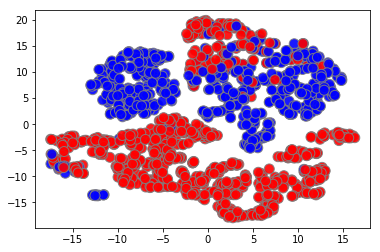

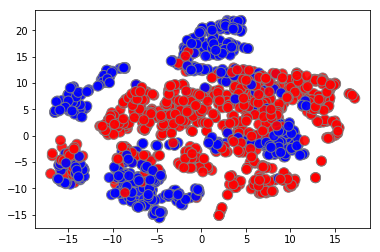

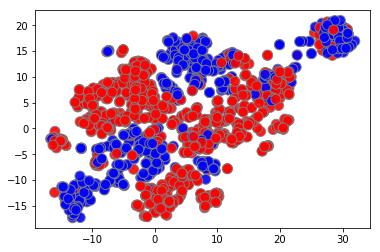

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


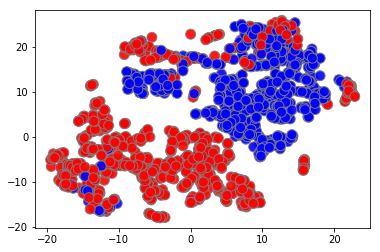

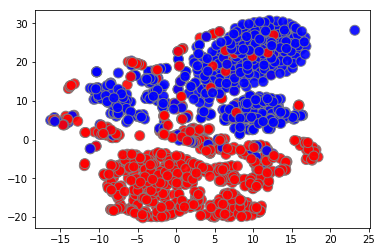

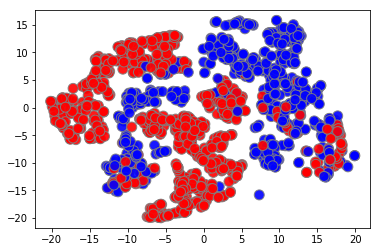

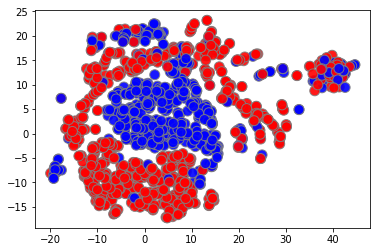

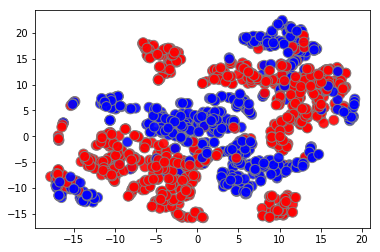

...

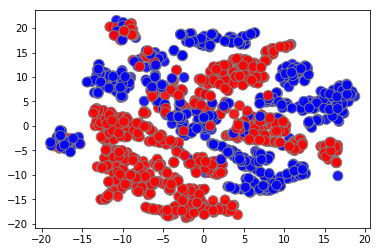

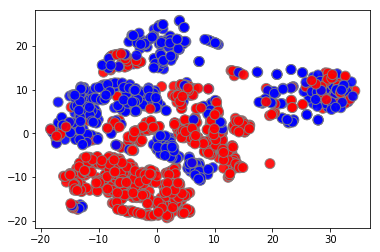

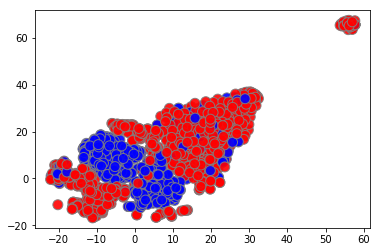

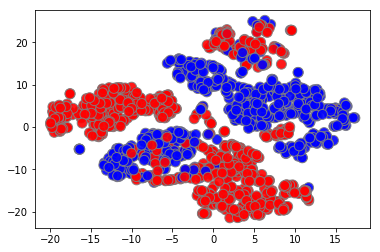

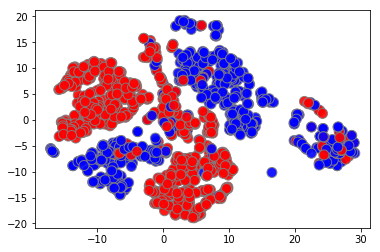

In [58]:
for i in range(128):
    plt.figure()
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(activations_b3c2[:, i, :])
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], 
               color=cm.bwr(y),s=100, alpha=0.9, edgecolor="gray")

In [19]:
model=vgg_tz_net

In [51]:
plt.imshow(model.layers[1].activation(TZ[0]))

TypeError: Cannot convert value dtype('uint64') to a TensorFlow DType.

In [37]:
weights[0].shape

(512, 2)

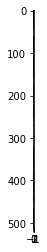

In [36]:
plt.imshow(weights[0])

In [20]:
W = model.layers[0].W.get_value(borrow=True)
W = np.squeeze(W)
print("W shape : ", W.shape)

pl.figure(figsize=(15, 15))
pl.title('conv1 weights')
nice_imshow(pl.gca(), make_mosaic(W, 6, 6), cmap=cm.binary)

AttributeError: 'InputLayer' object has no attribute 'W'

TypeError: Image data can not convert to float

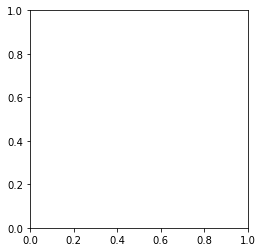

In [18]:
plt.imshow(vgg_tz_net.weights[0])

In [16]:
vgg_tz_net.weights[0]

<tf.Variable 'zt_block1_conv1/kernel:0' shape=(12, 12, 1, 32) dtype=float32_ref>

### prediction

In [14]:
from data_loaders import metadata_generator

In [15]:
from network_models import inference_step

In [16]:
multi_files_paths = get_multi_data_files("/data/km3net/Xy_multi_data_files/")

In [17]:
from keras import backend as K
from keras.utils import to_categorical
def get_TZ(X):
    TZ = np.sum(X, axis=(2,3))
    TZ=TZ[:,np.newaxis, ...]
    return TZ
def process_cos_z(y):
    y[y>0]=1
    y[y<0]=0
    return to_categorical(y)
test_data_generator=data_generator(fnames_test, batch_size=64, fdata=get_TZ, ftarget=process_cos_z)
metadata_keylist=["E", "dirx", "diry", "dirz", "posx", "posy", "posz", "dist"]
metadata_gen = metadata_generator(index_split_files, multi_files_paths, metadata_keylist)
        

In [18]:
metadata, y_true, y_pred, probs = inference_step(vgg_tz_net, test_data_generator, prediction_steps,
                                                metadata_gen)

100%|██████████| 810/810 [02:37<00:00,  5.13it/s]


In [19]:
np.all(y_true==0)

False

In [20]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_true, y_pred)
print(accuracy)

0.939229611332


In [21]:
from sklearn.metrics import confusion_matrix
confmat = confusion_matrix(y_true, y_pred)
print(confmat)

[[22128  1475]
 [ 1674 26541]]


In [22]:
from sklearn.metrics import confusion_matrix

In [23]:
confmat = np.matrix('26395 1820;1672 21931')

In [6]:
confmat = np.matrix('21931 1672 ;1820 26395')

In [7]:
confmat

matrix([[21931,  1672],
        [ 1820, 26395]])

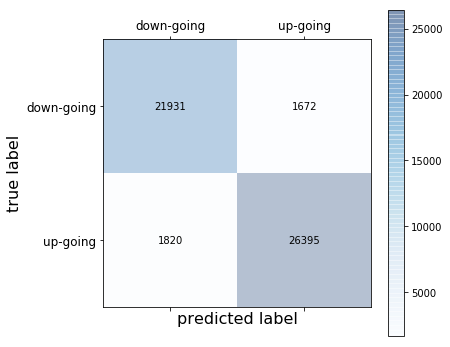

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(figsize=(6, 6))
cax = ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
	for j in range(confmat.shape[1]):
		ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center')
plt.xlabel('predicted label',size=16)
plt.ylabel('true label',size=16)
ax.set_xticklabels([''] + ["down-going", "up-going"], size=12)
ax.set_yticklabels([''] + ["down-going", "up-going"], size=12)
fig.colorbar(cax)
plt.show()



In [26]:
probs.shape

(51818, 2)

In [27]:
metadata

,E,dirx,diry,dirz,posx,posy,posz,dist,file_evt_index,evt_index
0,5.151250e+03,0.695440,0.100432,0.711531,148.874,18.266,-204.667,250.529145,0,2037
1,2.280210e+03,0.118267,0.037752,0.992264,-294.247,-300.629,-51.423,412.505283,0,1723
2,1.227530e+06,0.560446,-0.779207,-0.280601,-649.697,276.818,-20.660,411.898979,0,1449
3,5.644840e+02,0.204058,-0.915839,-0.345832,296.694,103.148,-66.745,320.942747,0,1557
4,1.987430e+05,0.832353,0.294585,-0.469476,-389.672,-588.968,453.233,446.268442,0,1008
5,9.474970e+03,0.507640,0.241117,-0.827142,-62.038,-98.563,-307.469,261.676735,0,2111
6,8.916460e+02,-0.197147,0.327520,-0.924048,-179.084,-188.555,81.570,252.803534,0,312
7,1.830970e+02,-0.934963,0.229431,0.270566,118.071,-350.659,-158.563,327.731095,0,1536
8,1.138800e+04,0.074698,0.650489,0.755833,301.674,74.226,-405.932,453.433227,0,626
9,9.183130e+03,0.182618,-0.951285,0.248410,273.884,297.142,-51.406,325.141888,0,2148


In [28]:
import matplotlib.pyplot as plt

In [29]:
mismatches = np.argwhere(y_pred!=y_true).ravel()

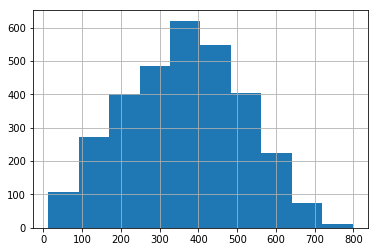

In [30]:
metadata.iloc[mismatches]["dist"].hist()

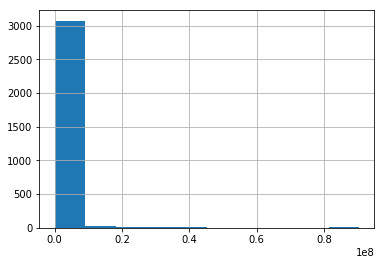

In [31]:
metadata.iloc[mismatches]["E"].hist()

In [32]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from keras.utils import to_categorical

In [33]:
n_classes = 2
fpr = dict()
tpr=dict()
roc_auc=dict()
Y_true = to_categorical(y_true)
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_true[:,i], probs[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
fpr["micro"], tpr["micro"], _ = roc_curve(y_true, y_pred)
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

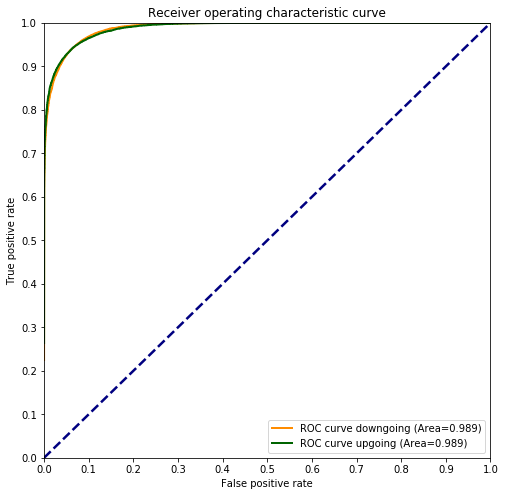

In [34]:
plt.figure(figsize=(8, 8))
lw = 2
plt.plot(fpr[0], tpr[0], color="darkorange",
         lw=lw, label="ROC curve downgoing (Area=%0.3f)" % roc_auc[0])
plt.plot(fpr[1], tpr[1], color="darkgreen",
         lw=lw, label="ROC curve upgoing (Area=%0.3f)" % roc_auc[1])

plt.plot([0,1],[0,1], color="navy", lw=2.5, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.yticks(np.arange(0,1.1,0.1))
plt.xticks(np.arange(0,1.1,0.1))
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("Receiver operating characteristic curve")
plt.legend(loc="lower right")
plt.show()


In [35]:
from sklearn.metrics import recall_score, precision_score, precision_recall_curve

In [36]:
from sklearn.metrics import average_precision_score

In [37]:
precision_score(y_true, y_pred)

0.94735151342090229

In [38]:
recall_score(y_true, y_pred)

0.9406698564593301

In [39]:
from sklearn.metrics import f1_score

In [40]:
f1_score(y_true, y_pred)

0.94399886183777626

In [41]:
average_precision = average_precision_score(y_true, y_pred)

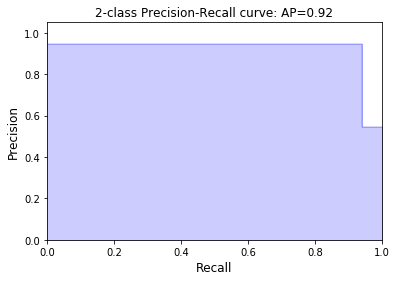

In [42]:
precision, recall, _ = precision_recall_curve(y_true, y_pred)
plt.step(recall, precision, color="b", alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel("Recall", size=12)
plt.ylabel("Precision", size=12)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.title("2-class Precision-Recall curve: AP={0:0.2f}".format(average_precision))

plt.show()

### efficiency plots

In [43]:
match_indices = np.where(y_true==y_pred)[0]

In [74]:
def efficiency(metadata, target_key, match_indices, logscale=False, nbins=20, xlabel=""):
    fig, axis = plt.subplots()
        
    metadata_arr = metadata[target_key]
    well_classified_evts_metadata = metadata.iloc[match_indices][target_key]
    
    if logscale:
        metadata_arr = np.log10(metadata_arr)
        well_classified_evts_metadata = np.log10(well_classified_evts_metadata)
        
    r_min, r_max = (metadata_arr.min(), metadata_arr.max())
    binned_var, bins_to_plot = np.histogram(metadata_arr, bins=nbins, 
                                             range = (2, 8))
    binned_well_cls, _ = np.histogram(well_classified_evts_metadata, bins = nbins, 
                                     range= (2, 8))
    efficiency = np.true_divide(binned_well_cls, binned_var)
    
    axis.plot(bins_to_plot[:-1], efficiency)
    axis.grid()
    axis.set_xlabel(xlabel)
    axis.set_ylabel("well_classified / total test events", size=12)
    axis.set_xlim([2, 8])
    axis.set_ylim([0.7, 1.0])
    axis.set_title("Classification efficiency")
    

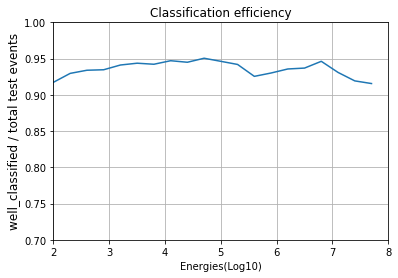

In [75]:
efficiency(metadata, "E", match_indices, logscale=True, xlabel="Energies(Log10)")

In [84]:
def efficiency(metadata, target_key, match_indices, logscale=False, nbins=15, xlabel=""):
    fig, axis = plt.subplots()
        
    metadata_arr = metadata[target_key]
    well_classified_evts_metadata = metadata.iloc[match_indices][target_key]
    
    if logscale:
        metadata_arr = np.log10(metadata_arr)
        well_classified_evts_metadata = np.log10(well_classified_evts_metadata)
        
    r_min, r_max = (metadata_arr.min(), metadata_arr.max())
    binned_var, bins_to_plot = np.histogram(metadata_arr, bins=nbins, 
                                             range = (r_min, r_max))
    binned_well_cls, _ = np.histogram(well_classified_evts_metadata, bins = nbins, 
                                     range= (r_min, r_max))
    efficiency = np.true_divide(binned_well_cls, binned_var)
    
    axis.plot(bins_to_plot[:-1], efficiency)
    axis.grid()
    axis.set_xlabel(xlabel)
    axis.set_ylabel("well_classified / total test events", size=12)
    axis.set_xlim([r_min, r_max])
    axis.set_ylim([0.7, 1.0])
    axis.set_title("Classification efficiency")

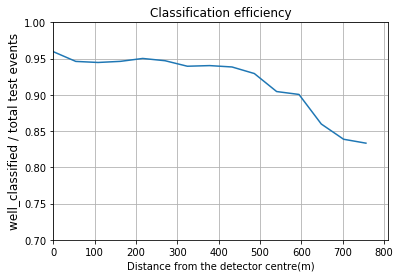

In [85]:
efficiency(metadata, "dist", match_indices, logscale=False, xlabel="Distance from the detector centre(m)")

In [100]:
def energy_maps(energies, nbins = 5):
    
    log_energies = np.log10(energies)
    
    E_maps = []
    binned, energy_bins = np.histogram(log_energies,bins=[log_energies.min(), 2.5, 3, 4, 5.5, log_energies.max() ])#, 
                                  #range=(log_energies.min(), log_energies.max()))

    for i, E in enumerate(zip(energy_bins[:-1], energy_bins[1:])):
        lowE, highE = E
        E_maps.append((i, np.where(np.logical_and(log_energies>=lowE, log_energies<highE))[0]))
    
    return E_maps, energy_bins

In [101]:
energies = metadata["E"]

In [102]:
E_maps, E_bins = energy_maps(energies)

In [103]:
for i in range(len(E_maps)):
    print(len(E_maps[i][1]))

3130
6719
17571
17790
6607


In [104]:
print(E_bins)

[-1.23781151  2.5         3.          4.          5.5         7.99156097]


In [105]:
def distance_maps(distances, nbins = 5):
    
    d_maps = []
    binned, dist_bins = np.histogram(distances,bins=[6.13e-01, 170, 320, 450, 500, 8.106e+02])#, 
                                  #range=(log_energies.min(), log_energies.max()))
    for i, d in enumerate(zip(dist_bins[:-1],dist_bins[1:])):
        lowd, highd = d
        d_maps.append((i, np.where(np.logical_and(distances>=lowd, distances<highd))[0]))
    return d_maps, dist_bins

In [106]:
d_maps, d_bins = distance_maps(metadata["dist"])
print(d_bins)

[  6.13000000e-01   1.70000000e+02   3.20000000e+02   4.50000000e+02
   5.00000000e+02   8.10600000e+02]


In [107]:
for i in range(len(d_maps)):
    print(len(d_maps[i][1]))

7017
16205
16495
5266
6833


### ROC function

In [137]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from keras.utils import to_categorical


def roc_function(E_map_list, E_bins, y_true, y_pred, probs, var, y_n_classes = 2):
    Y_true = to_categorical(y_true)
    n_classes = 2
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    plt.figure(figsize=(10, 7))
    plt.grid()
    color_list = ["red", "blue", "green", "orange", "magenta", "brown", "black"]
    
    for em in range(len(E_map_list)):
        E_map = E_map_list[em][1]
    
        for i, ls in zip(range(n_classes-1), ['-', '--']):
            fpr[i], tpr[i], _ = roc_curve(Y_true[E_map][:,i], probs[E_map][:,i])
            roc_auc[i] = auc(fpr[i], tpr[i])
            lw = 1.5
            
            plt.plot(fpr[i], tpr[i], color=color_list[em], linestyle=ls,
                     lw=lw, label="ROC curve {} E_bin:[{:.1f},{:.1f}] class {} (Area={:.3f})".format(var, E_bins[em], 
                                                                                                      E_bins[em+1], 
                                                                                                  i, roc_auc[i]))
            
            plt.plot([0,1],[0,1], color="navy", lw=lw, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.01])
            plt.xlabel("False positive rate", size=12)
            plt.ylabel("True positive rate", size=12)
            plt.title("Receiver operating characteristic curve")
            plt.legend(loc="lower right")
            
        
        fpr["micro"], tpr["micro"], _ = roc_curve(y_true[E_map], y_pred[E_map])
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
 
    return


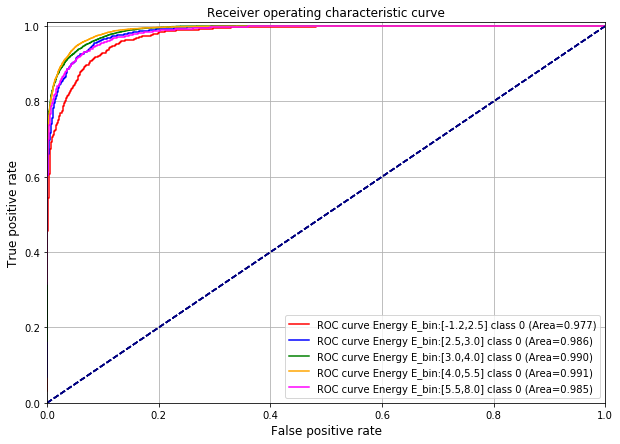

In [138]:
roc_function(E_maps, E_bins, y_true, y_pred, probs, "Energy" )

In [134]:
d_bins = [0.5, 170, 320, 450, 500, 810]

In [139]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from keras.utils import to_categorical


def roc_function(E_map_list, E_bins, y_true, y_pred, probs, var, y_n_classes = 2):
    Y_true = to_categorical(y_true)
    n_classes = 2
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    plt.figure(figsize=(10, 7))
    plt.grid()
    color_list = ["red", "blue", "green", "orange", "magenta", "brown", "black"]
    
    for em in range(len(E_map_list)):
        E_map = E_map_list[em][1]
    
        for i, ls in zip(range(n_classes-1), ['-', '--']):
            fpr[i], tpr[i], _ = roc_curve(Y_true[E_map][:,i], probs[E_map][:,i])
            roc_auc[i] = auc(fpr[i], tpr[i])
            lw = 1.5
            
            plt.plot(fpr[i], tpr[i], color=color_list[em], linestyle=ls,
                     lw=lw, label="ROC curve {} d_bin:[{},{}] class {} (Area={:.3f})".format(var, E_bins[em], 
                                                                                                      E_bins[em+1], 
                                                                                                  i, roc_auc[i]))
            
            plt.plot([0,1],[0,1], color="navy", lw=lw, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.01])
            plt.xlabel("False positive rate", size=12)
            plt.ylabel("True positive rate", size=12)
            plt.title("Receiver operating characteristic curve")
            plt.legend(loc="lower right")
            
        
        fpr["micro"], tpr["micro"], _ = roc_curve(y_true[E_map], y_pred[E_map])
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
 
    return


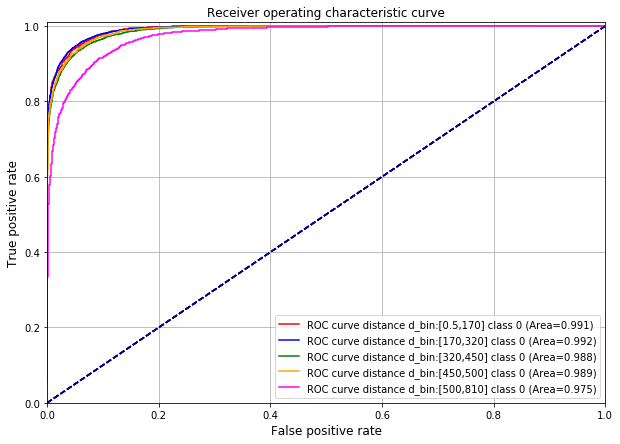

In [140]:
roc_function(d_maps, d_bins, y_true, y_pred, probs, "distance" )

### multi slice efficiency plots to be done

In [ ]:
def efficiency(metadata, target_key, match_indices, logscale=False, nbins=12, xlabel=""):
    fig, axis = plt.subplots()
        
    metadata_arr = metadata[target_key]
    well_classified_evts_metadata = metadata.iloc[match_indices][target_key]
    
    if logscale:
        metadata_arr = np.log10(metadata_arr)
        well_classified_evts_metadata = np.log10(well_classified_evts_metadata)
        
    r_min, r_max = (metadata_arr.min(), metadata_arr.max())
    binned_var, bins_to_plot = np.histogram(metadata_arr, bins=nbins, 
                                             range = (r_min, r_max))
    binned_well_cls, _ = np.histogram(well_classified_evts_metadata, bins = nbins, 
                                     range= (r_min, r_max))
    efficiency = np.true_divide(binned_well_cls, binned_var)
    
    axis.plot(bins_to_plot[:-1], efficiency)
    axis.grid()
    axis.set_xlabel(xlabel)
    axis.set_ylabel("well_classified / total test events", size=12)
    axis.set_xlim([r_min, r_max])
    axis.set_ylim([0.0, 1.0])
    axis.set_title("Classification efficiency")
    

In [10]:
from keras.utils import plot_model

In [11]:
plot_model(model=vgg_tz_net, to_file="model_updown_shapes.png", show_shapes=True)

In [12]:
plot_model(model=vgg_tz_net, to_file="model_updown.png", show_shapes=False)

### plot ZT event

In [14]:
fname = fnames_train[0]

In [15]:
np.load(fname).keys()

['y', 'x']

In [16]:
X = np.load(fname)["x"]
y = np.load(fname)["y"]

In [17]:
def get_TZ(X):
    TZ = np.sum(X, axis=(2,3))
    return TZ
def process_cos_z(y):
    y[y>0]=1
    y[y<0]=0
    return y

In [18]:
TZ = get_TZ(X)
y_updown = process_cos_z(y)

In [19]:
import matplotlib.pyplot as plt
%matplotlib inline

In [20]:
TZ[0].shape

(75, 18)

In [21]:
ZT = np.swapaxes(TZ, axis1=1, axis2=2)

In [22]:
ZT[0].shape

(18, 75)

In [23]:
downgoing = np.where(y==0)[0]
upgoing = np.where(y==1)[0]

In [24]:
evt=downgoing[0]

0.0


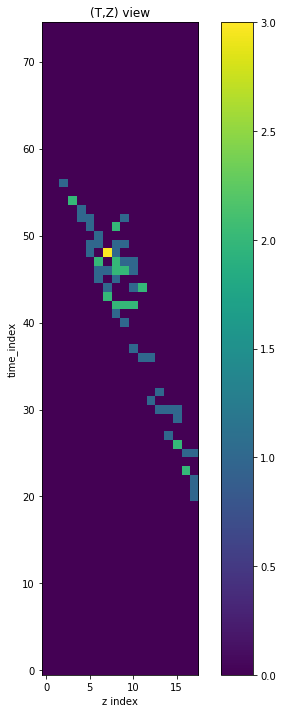

In [25]:
plt.figure(figsize=(8, 12))
plt.imshow(TZ[evt], origin="lower")
plt.colorbar()
plt.xlabel("z index")
plt.ylabel("time_index")
plt.title("(T,Z) view")
print(y[evt])

0.0


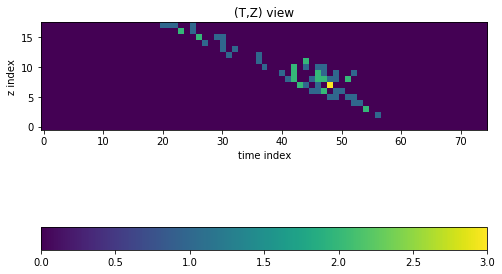

In [26]:
plt.figure(figsize=(8, 12))
plt.imshow(ZT[evt], origin="lower")
plt.colorbar(orientation="horizontal")
plt.xlabel("time index")
plt.ylabel("z index")
plt.title("(T,Z) view")
print(y[evt])

In [27]:
evt = upgoing[10]

1.0


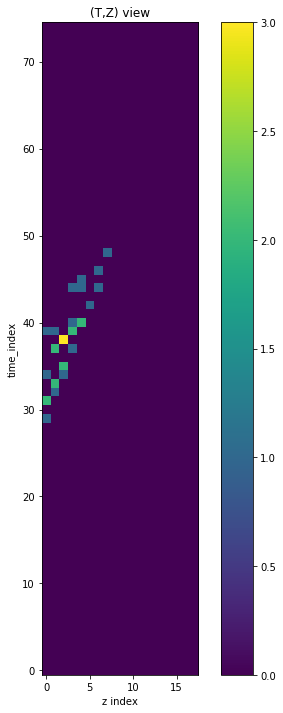

In [28]:
plt.figure(figsize=(8, 12))
plt.imshow(TZ[evt], origin="lower")
plt.colorbar()
plt.xlabel("z index")
plt.ylabel("time_index")
plt.title("(T,Z) view")
print(y[evt])

1.0


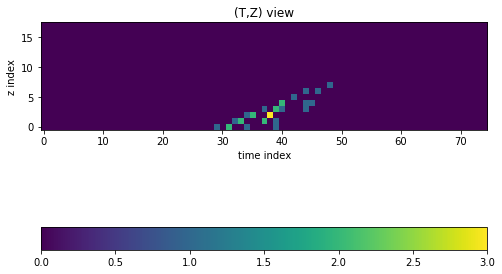

In [33]:
plt.figure(figsize=(8, 12))
plt.imshow(ZT[evt], origin="lower")
plt.colorbar(orientation="horizontal")
plt.xlabel("time index")
plt.ylabel("z index")
plt.title("(T,Z) view")
print(y[evt])

In [141]:
import numpy as np

In [142]:
history = np.load("model/updown_classification/tz_updown_classification_historyupdown_classification.pkl")

In [143]:
# %load history_plot
import matplotlib
matplotlib.pyplot.switch_backend('agg')
import matplotlib.pyplot as plt

def history_plot(history, name, flag):
    plt.figure()
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.plot(history['loss'])
    plt.ylim([0.12, 0.3])
    if 'val_loss' in history:
        plt.plot(history['val_loss'])
    plt.grid()
    plt.legend(['Training', 'Validation'])
    if flag=="save":
        plt.savefig("./plots/Loss_"+name+".png")
    elif (flag=="show"):
        plt.show()
    elif (flag=="both"):
        plt.savefig("./plots/Loss_"+name+".png")
        plt.show()
    
    plt.figure()
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.plot(history['acc'])
    plt.ylim([0.7, 1.0])
    if 'val_acc' in history:
        plt.plot(history['val_acc'])
    plt.grid()
    plt.legend(['Training', 'Validation'], loc='lower right')
    if flag=="save":
        plt.savefig("./plots/Accuracy_"+name+".png")
    elif (flag=="show"):
        plt.show()
    elif (flag=="both"):
        plt.savefig("./plots/Accuracy_"+name+".png")
        plt.show()

COLORS = ['red', 'blue', 'green', 'orange', 'purple']
        


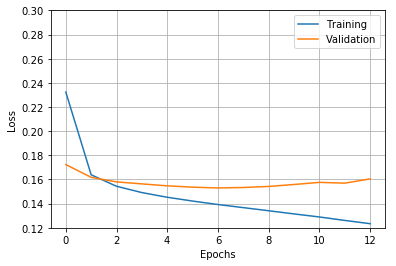

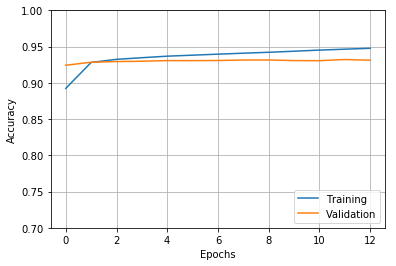

In [144]:
history_plot(history, "updown_classification_history", "both")